In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [10]:
!pip install ultralytics


In [11]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')


image = cv2.imread("/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/images/1-1_jpg.rf.3c35c15f5361d33821647bfd181b0af7.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 416x416 and 3 channels.


100%|██████████| 5.35M/5.35M [00:00<00:00, 178MB/s]



image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/images/1-1_jpg.rf.3c35c15f5361d33821647bfd181b0af7.jpg: 640x640 1 vase, 8.3ms
Speed: 14.6ms preprocess, 8.3ms inference, 255.0ms postprocess per image at shape (1, 3, 640, 640)


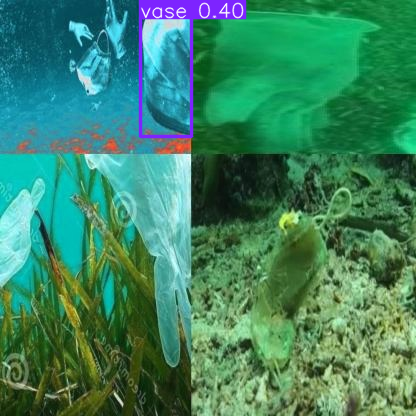

In [12]:
 #Load YOLOv11 pre-trained model
model = YOLO("yolo11n.pt")  # Replace with YOLOv11 weights

# Object Detection on a sample image
image = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/images/1-1_jpg.rf.3c35c15f5361d33821647bfd181b0af7.jpg"
result_predict = model.predict(source=image, imgsz=(640))

# Visualize detection results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


In [14]:
# Build from YAML and transfer weights
Final_model = YOLO('yolo11n.yaml').load('yolo11n.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml",epochs=25, imgsz = 640, batch = 16 ,lr0=0.01, dropout= 0.15, device = 0)

Transferred 499/499 items from pretrained weights
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=yolo11n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fa

100%|██████████| 755k/755k [00:00<00:00, 47.8MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/labels... 3628 images, 2 backgrounds, 0 corrupt: 100%|██████████| 3628/3628 [00:26<00:00, 135.90it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid/labels... 1001 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1001/1001 [00:06<00:00, 154.39it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      2.73G      1.454      3.646      1.577         42        640: 100%|██████████| 227/227 [00:51<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:07<00:00,  4.51it/s]


                   all       1001       1891      0.616      0.207      0.155     0.0948

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      2.67G      1.471      2.633      1.583         62        640: 100%|██████████| 227/227 [00:48<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  5.18it/s]


                   all       1001       1891       0.66        0.2      0.202      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      2.74G      1.456      2.331      1.574         33        640: 100%|██████████| 227/227 [00:47<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.38it/s]


                   all       1001       1891      0.567      0.214      0.212       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      2.71G      1.447      2.201      1.572         51        640: 100%|██████████| 227/227 [00:47<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.64it/s]


                   all       1001       1891      0.616      0.282      0.289      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      2.71G      1.423      2.037      1.556         42        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]


                   all       1001       1891      0.639      0.346       0.35      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      2.71G      1.381      1.911      1.515         71        640: 100%|██████████| 227/227 [00:47<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.37it/s]


                   all       1001       1891      0.568      0.344      0.322      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      2.71G      1.371      1.791       1.51         78        640: 100%|██████████| 227/227 [00:47<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]

                   all       1001       1891      0.717      0.319       0.36      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      2.71G      1.338      1.717      1.486         59        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.55it/s]

                   all       1001       1891      0.786      0.341      0.394      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      2.71G      1.326      1.649      1.471         43        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.64it/s]

                   all       1001       1891      0.679      0.364      0.409      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      2.72G      1.305      1.569      1.451         62        640: 100%|██████████| 227/227 [00:47<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.68it/s]

                   all       1001       1891      0.726      0.407      0.467      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      2.72G      1.297       1.53      1.449         40        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.64it/s]

                   all       1001       1891       0.65      0.409      0.437      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      2.71G      1.273      1.469      1.429         38        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.69it/s]

                   all       1001       1891      0.736      0.363      0.439      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      2.72G       1.24      1.418      1.406         53        640: 100%|██████████| 227/227 [00:47<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.81it/s]

                   all       1001       1891      0.602      0.393      0.419       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      2.71G      1.237      1.364      1.406         39        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.62it/s]

                   all       1001       1891      0.574      0.467      0.483      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      2.65G      1.223       1.32      1.396         37        640: 100%|██████████| 227/227 [00:47<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.69it/s]

                   all       1001       1891      0.691      0.442      0.496      0.314


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      2.71G      1.185      1.179      1.398         27        640: 100%|██████████| 227/227 [00:48<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.43it/s]

                   all       1001       1891       0.57      0.497      0.499      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      2.71G      1.154      1.089      1.376         39        640: 100%|██████████| 227/227 [00:47<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.63it/s]

                   all       1001       1891      0.694      0.474      0.527      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      2.71G       1.13      1.043      1.363         34        640: 100%|██████████| 227/227 [00:47<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.74it/s]

                   all       1001       1891      0.622      0.494      0.532      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      2.69G      1.116      1.007      1.353         27        640: 100%|██████████| 227/227 [00:47<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.52it/s]

                   all       1001       1891      0.534      0.576      0.552      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      2.71G      1.093     0.9537      1.328         43        640: 100%|██████████| 227/227 [00:47<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.61it/s]

                   all       1001       1891      0.604      0.569      0.562      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      2.71G      1.083     0.9301      1.324         15        640: 100%|██████████| 227/227 [00:47<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.79it/s]

                   all       1001       1891       0.68       0.55      0.572      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      2.71G      1.061     0.8844      1.303         36        640: 100%|██████████| 227/227 [00:47<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.34it/s]

                   all       1001       1891       0.53      0.619      0.596      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      2.71G      1.057     0.8588      1.298         18        640: 100%|██████████| 227/227 [00:47<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.50it/s]

                   all       1001       1891       0.66      0.554      0.585      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      2.71G      1.028     0.8332      1.283         21        640: 100%|██████████| 227/227 [00:47<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.54it/s]

                   all       1001       1891       0.57       0.62       0.61      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      2.71G      1.017     0.8197       1.27         36        640: 100%|██████████| 227/227 [00:47<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.39it/s]

                   all       1001       1891      0.669      0.576       0.62      0.401



25 epochs completed in 0.379 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:06<00:00,  4.82it/s]


                   all       1001       1891      0.668      0.574      0.619      0.401
                  Mask         77         90      0.871      0.444      0.739      0.545
                   can         18         20      0.366      0.404       0.46      0.157
             cellphone         61         71      0.929      0.972      0.986      0.855
           electronics         27         40      0.664      0.643      0.665      0.398
               gbottle         36         82      0.552      0.817      0.747      0.494
                 glove         37         55      0.913      0.762      0.872      0.706
                 metal         10         22      0.498      0.182       0.23      0.125
                  misc         48         51      0.423      0.471      0.431      0.257
                   net        146        148      0.825      0.878      0.921       0.63
                  pbag        290        330      0.842      0.967      0.931      0.794
               pbottl

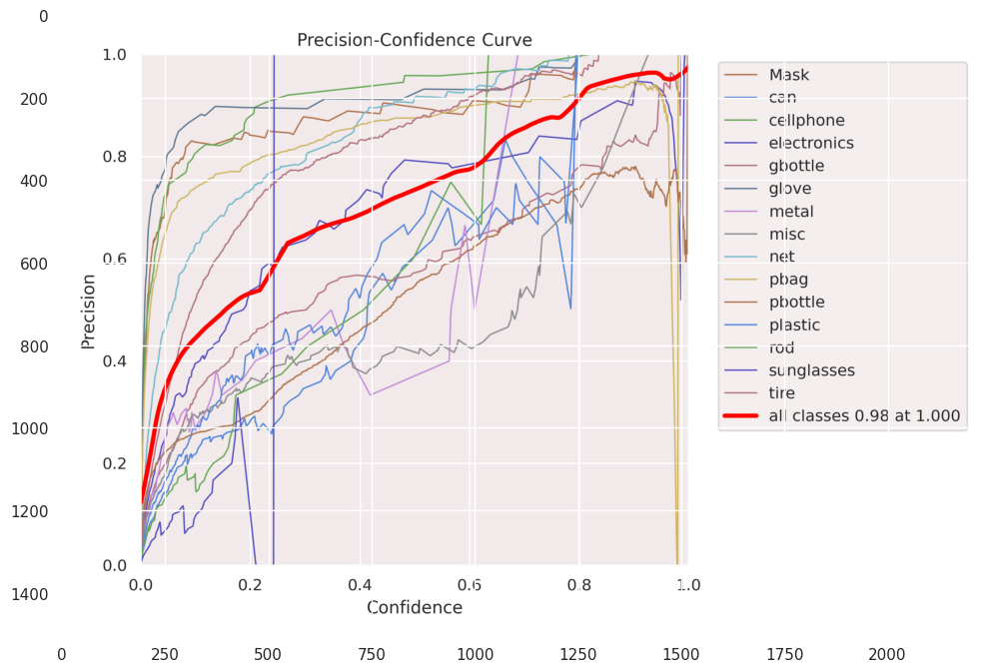

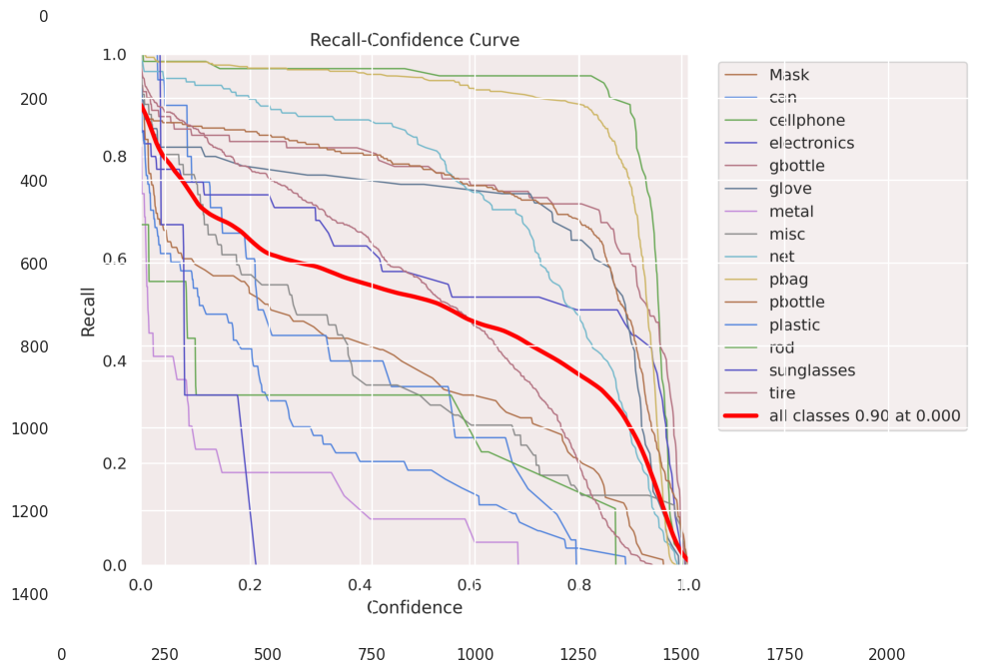

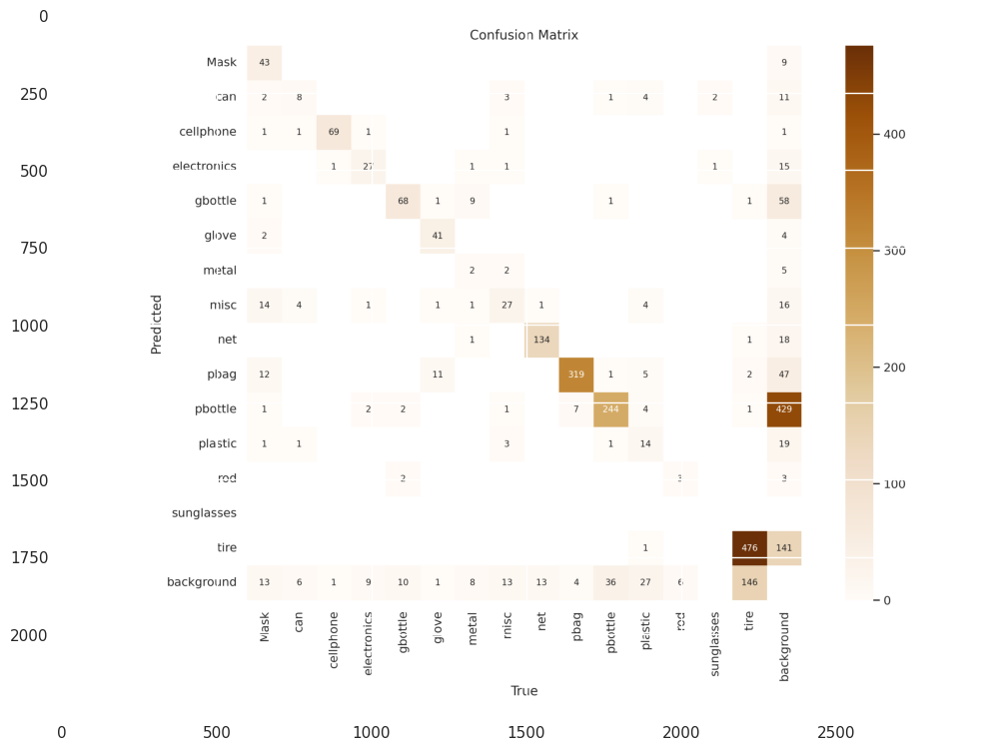

In [29]:
list_of_metrics = ["P_curve.png","R_curve.png","confusion_matrix.png"]
for i in list_of_metrics:
    img = cv2.imread(f"/kaggle/working/ultralytics/runs/detect/train/{i}")
    plt.figure(figsize = (12,10))
    plt.imshow(np.array(img))
    plt.show()

In [18]:
results = pd.read_csv("/kaggle/working/ultralytics/runs/detect/train/results.csv")
results.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,63.9102,1.45379,3.64608,1.57697,0.61622,0.20651,0.15460,0.09478,1.49435,2.78938,1.79891,0.000175,0.000175,0.000175
1,2,120.1070,1.47083,2.63282,1.58330,0.65984,0.19955,0.20179,0.11804,1.58852,2.85869,1.86079,0.000336,0.000336,0.000336
2,3,174.8400,1.45560,2.33113,1.57412,0.56673,0.21370,0.21175,0.12956,1.53606,2.51266,1.90637,0.000484,0.000484,0.000484
3,4,228.8590,1.44706,2.20130,1.57158,0.61609,0.28197,0.28917,0.17855,1.50814,2.14006,1.78396,0.000464,0.000464,0.000464
4,5,283.0510,1.42256,2.03723,1.55606,0.63864,0.34626,0.34952,0.21169,1.47245,1.81411,1.77304,0.000443,0.000443,0.000443


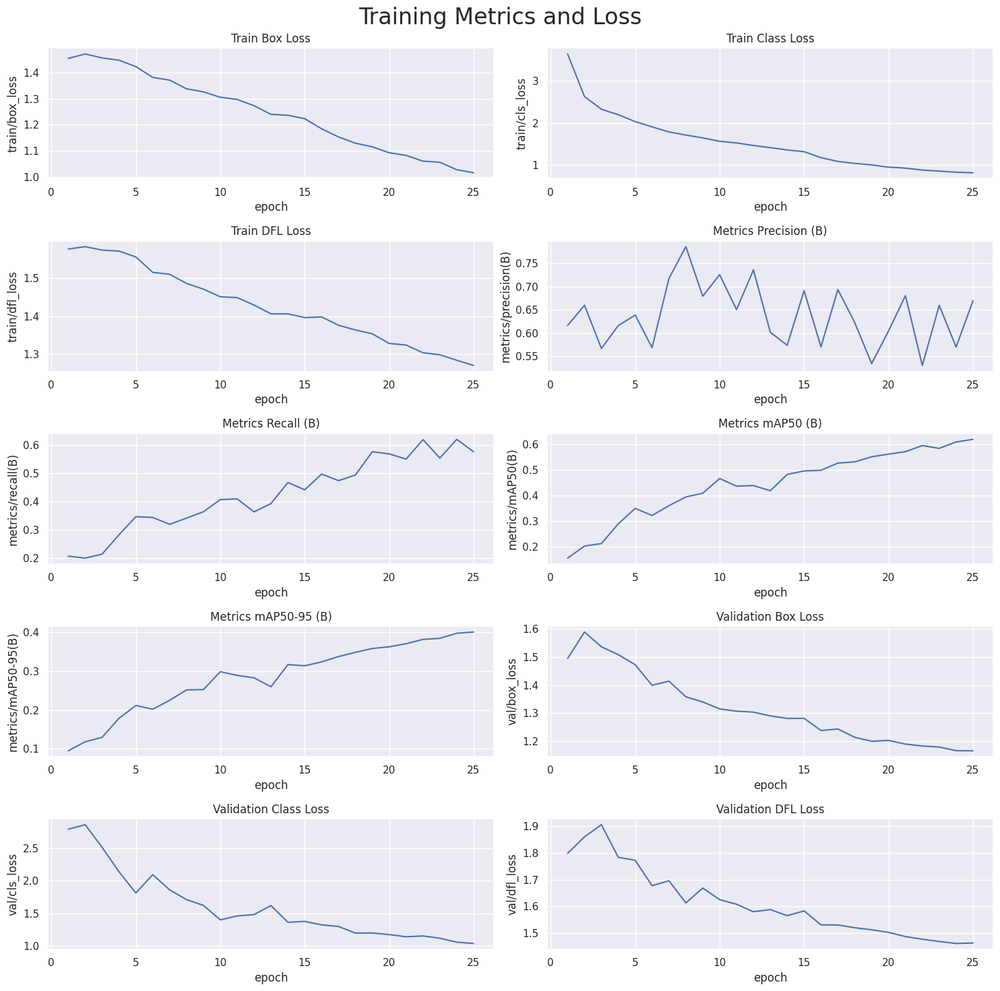

In [19]:
results.columns = results.columns.str.strip()
# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [20]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/ultralytics/runs/detect/train/weights/best.pt')

# Evaluating the model on the testset
metrics = Valid_model.val(split = 'test')

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,585,077 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/labels... 501 images, 0 backgrounds, 0 corrupt: 100%|██████████| 501/501 [00:02<00:00, 200.39it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:04<00:00,  7.66it/s]


                   all        501        966      0.607      0.653      0.658      0.444
                  Mask         33         37          1      0.541      0.873      0.694
                   can         13         19      0.416      0.316      0.411      0.215
             cellphone         40         46      0.874          1      0.992      0.844
           electronics         14         19      0.522      0.789      0.815      0.529
               gbottle         27         63      0.692      0.713      0.741      0.477
                 glove         23         34      0.962      0.754      0.767      0.627
                 metal          2          5          0          0     0.0602     0.0309
                  misc         30         33      0.481      0.506      0.519      0.308
                   net         63         65      0.803      0.846      0.878      0.581
                  pbag        128        166      0.705      0.964      0.877      0.737
               pbottl

In [21]:
# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.6068732157435693
metrics/recall(B):  0.6526180651624791
metrics/mAP50(B):  0.6581341638128071
metrics/mAP50-95(B):  0.4442146542068752



image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-586_jpg.rf.4713512a7ec046e7b92b8cc249e27698.jpg: 640x640 1 pbag, 11.0ms
Speed: 3.0ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


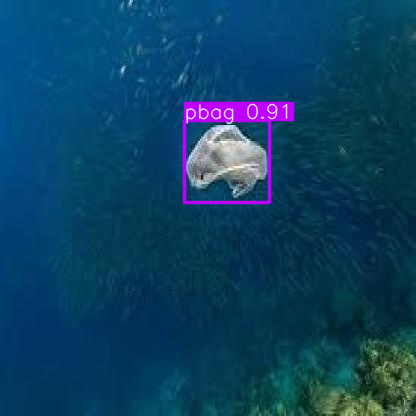


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-67__flipv_jpg.rf.5116738243538b4e1bf78aaa4e7e8a5a.jpg: 640x640 1 gbottle, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


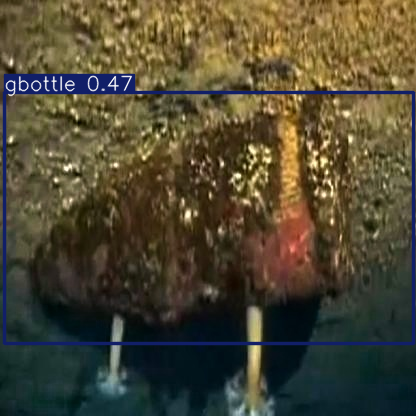


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/mask_in_the_ocean27_jpg.rf.b07f4e441e732918725cedb195537777.jpg: 640x640 1 Mask, 1 glove, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


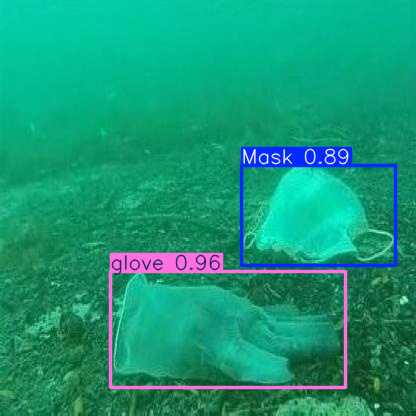


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-256__flipv_jpeg_jpg.rf.3ec4361dbaee73f6ecc417bfc687e4e1.jpg: 640x640 1 gbottle, 9.9ms
Speed: 3.3ms preprocess, 9.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


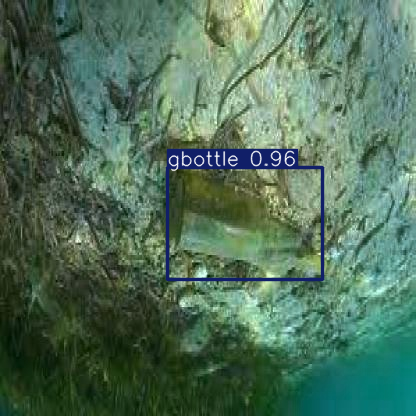


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1204_jpg.rf.964e8c3cd8d52d79201bfd01bbcf4347.jpg: 640x640 5 tires, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


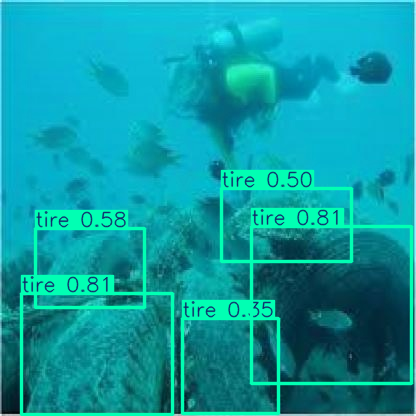


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1015__flipv_jpg.rf.a31098f07039159d43bfd2a851e2627c.jpg: 640x640 (no detections), 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


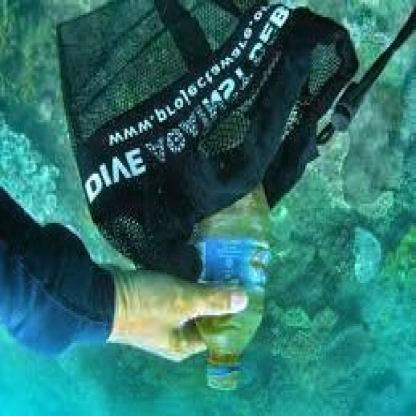


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-701__flipv_jpg.rf.26992e3280b5f5b52bd33c9cddf68e55.jpg: 640x640 1 pbag, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


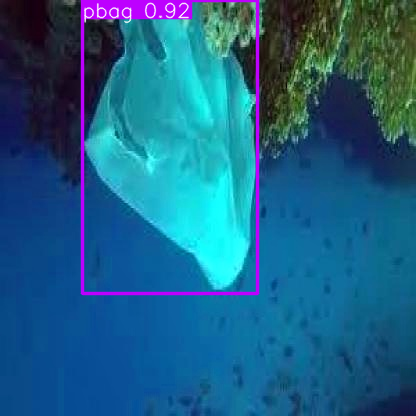


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1175_jpeg_jpg.rf.1a62512d155d23fc51a5a4e8b750f58d.jpg: 640x640 1 net, 2 tires, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


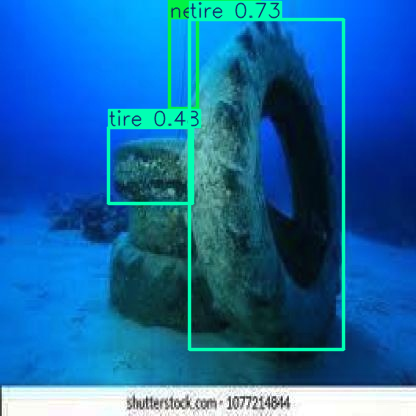


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1285__flipv_jpg.rf.164503c6dad99ce8c147cb3706586431.jpg: 640x640 (no detections), 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


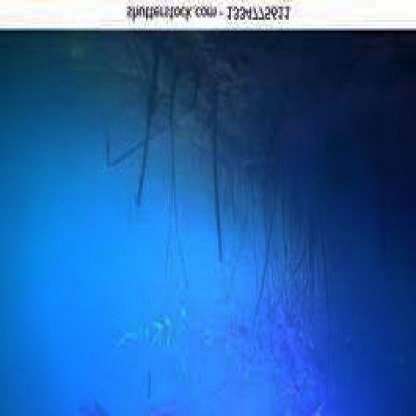


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-327_jpeg_jpg.rf.550fd54e60e695dacdf9a1a3fd3f7e6e.jpg: 640x640 2 cellphones, 7.5ms
Speed: 2.0ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


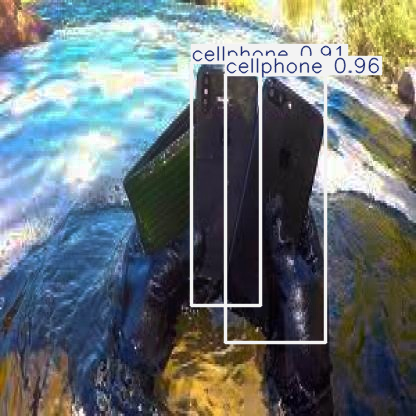


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-441__fliph_jpg.rf.f3ae4a0017bb10df10f4f2b916177d03.jpg: 640x640 2 cellphones, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


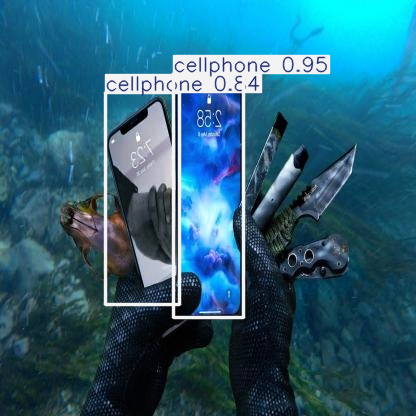


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-529__flipv_jpg.rf.8d0a1005df418d93e3f3dbaa6650278a.jpg: 640x640 1 pbag, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


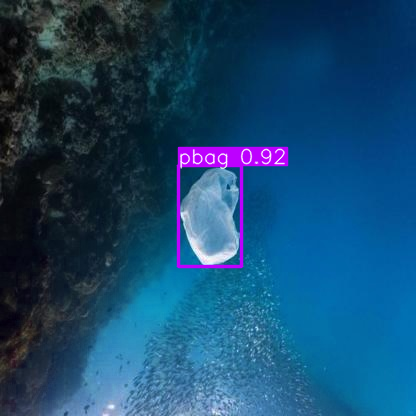


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/mask_in_the_ocean52_jpg.rf.d95b9d30474b7e6d3356e9480b7d786c.jpg: 640x640 3 Masks, 1 glove, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


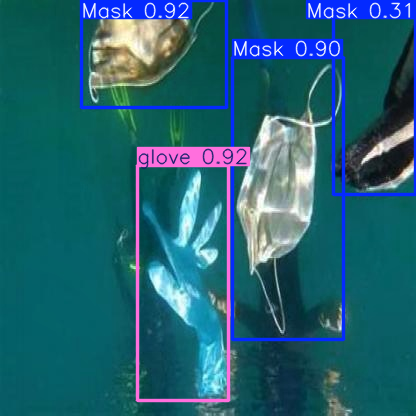


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1167__fliph_jpg.rf.7f13b841ebe24675c0712b8a3c77a46c.jpg: 640x640 21 tires, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


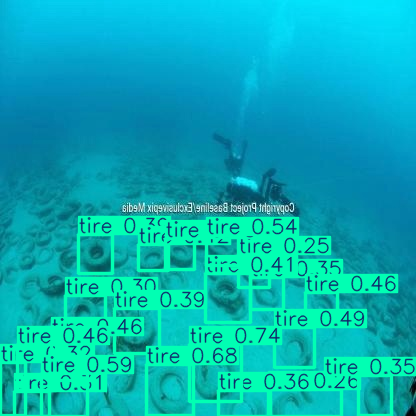


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-327__flipv_jpeg_jpg.rf.b3ff4143445cc07151fb454dd2303875.jpg: 640x640 2 cellphones, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


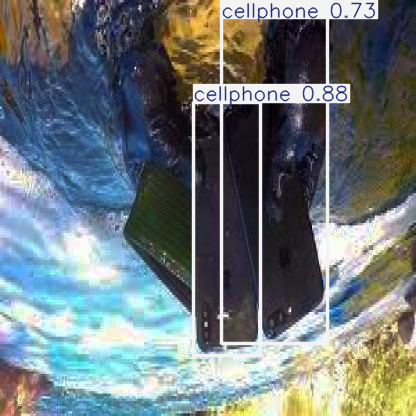


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-15__flipv_jpg.rf.6008f698f7a797d8ea6f2f8ea1c88ffa.jpg: 640x640 3 pbottles, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


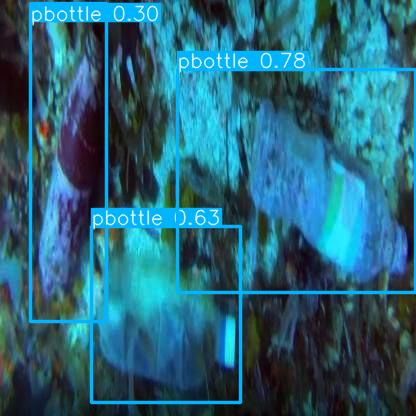


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-61_jpg.rf.605b2cc549591d5dd1e963e722c31024.jpg: 640x640 1 net, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


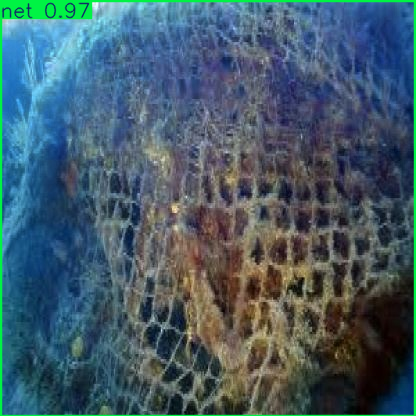


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-143__fliph_jpg.rf.282f875aa405b3d48ebd42c89baf4f93.jpg: 640x640 1 net, 8.1ms
Speed: 2.1ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


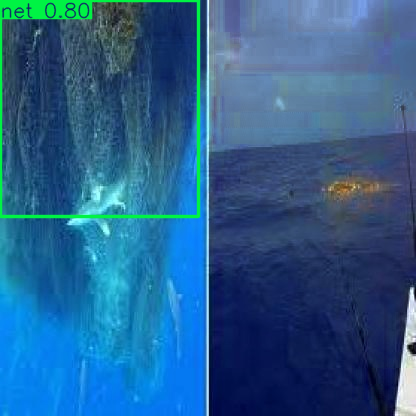


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-316__flipv_jpg.rf.1202d2a608b881f4094b01f8b692302b.jpg: 640x640 1 cellphone, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


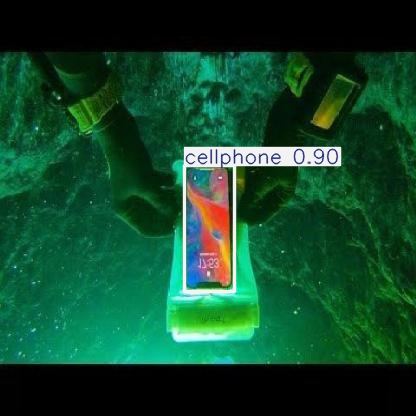


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-491__fliph_jpg.rf.2bc296741b933394fcd8351161caae57.jpg: 640x640 1 pbag, 11.4ms
Speed: 3.1ms preprocess, 11.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


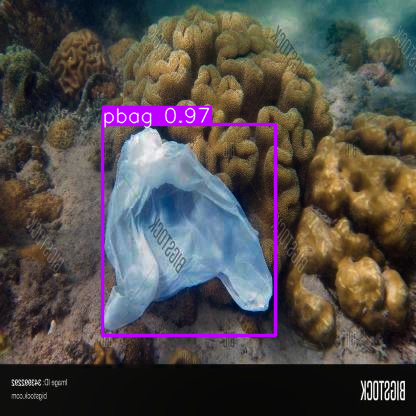


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-108__fliph_jpg.rf.ad208bb7976cebbe73ae2ec95a656a04.jpg: 640x640 1 net, 10.3ms
Speed: 3.3ms preprocess, 10.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


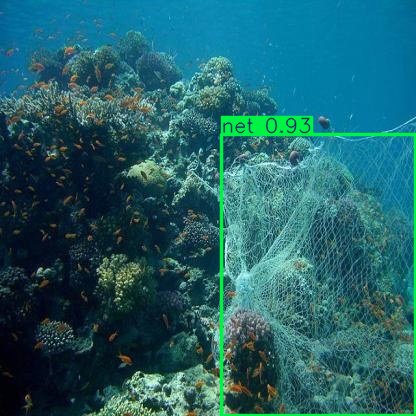


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-104_jpg.rf.536bc6cdbba9116025a16b24adfe7e9a.jpg: 640x640 1 net, 11.1ms
Speed: 3.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


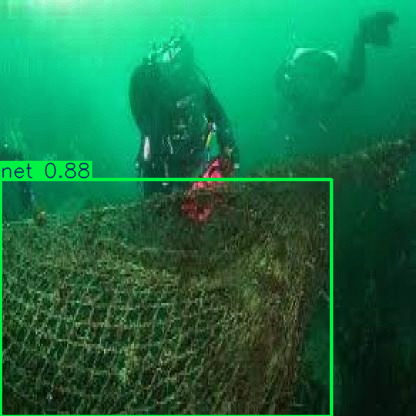


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1110__flipv_jpg.rf.1b5472037858f28fdc3f9eaee7667850.jpg: 640x640 1 pbottle, 11.6ms
Speed: 3.1ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


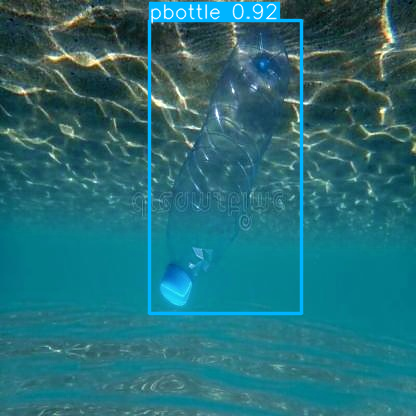


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-692__fliph_jpg.rf.59d99fe13d4b8bc499ae3d40ead5953b.jpg: 640x640 1 pbag, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


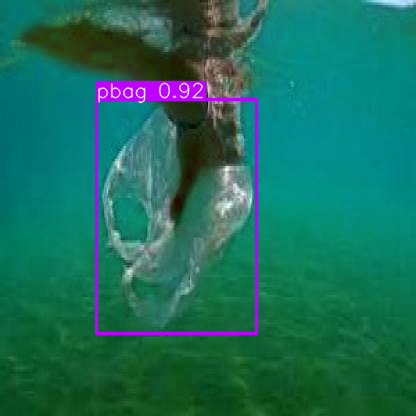


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-222_png_jpg.rf.7d67ee41604b0cd33ab997bf99aa9799.jpg: 640x640 1 misc, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


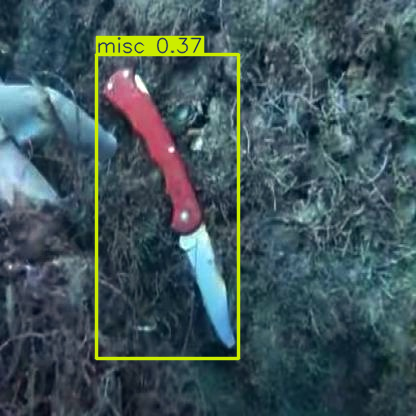


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-492__fliph_jpg.rf.9ea9eacbcdfeaee52424628f8f8b5bcc.jpg: 640x640 2 pbags, 7.7ms
Speed: 2.0ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


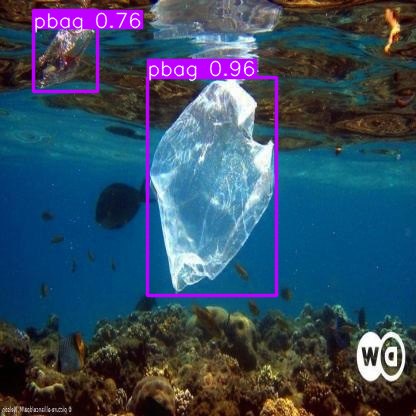


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-799-1-__fliph_jpg.rf.c619a8d67d8411ebda34d296b4601563.jpg: 640x640 1 pbag, 11.9ms
Speed: 2.2ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


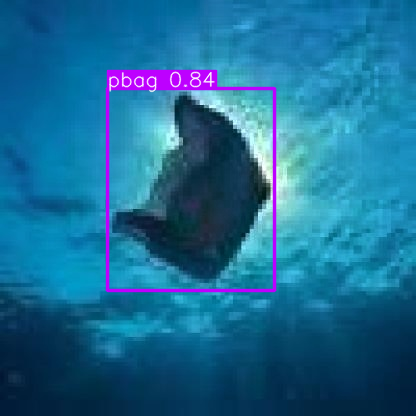


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1225__fliph_jpg.rf.a2adf643e5d6b07037aa0cb7acfc1a83.jpg: 640x640 1 tire, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


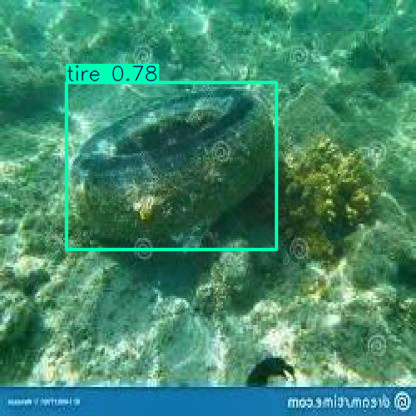


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-527__fliph_jpg.rf.0b6c9fc16b92583dd2bf186b91156dda.jpg: 640x640 2 pbags, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


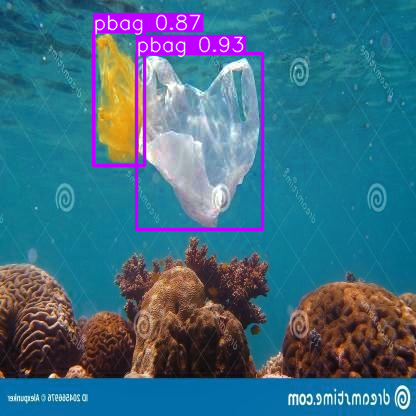


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-98__flipv_jpg.rf.e5415ed85ee81480c85adfbbfc35e91f.jpg: 640x640 (no detections), 13.7ms
Speed: 3.1ms preprocess, 13.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


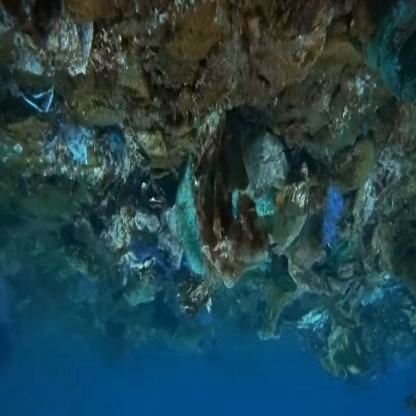


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-519_jpg.rf.83f03c2a6c71429d5fe00987c3a6953e.jpg: 640x640 2 pbags, 11.5ms
Speed: 3.2ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


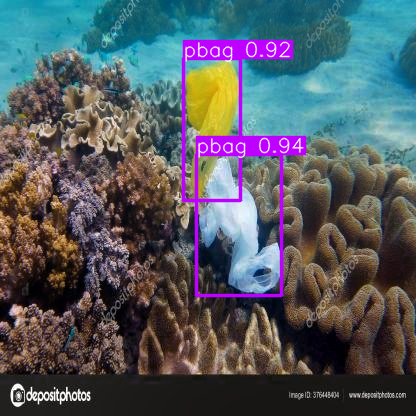


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-46_jpg.rf.e949d19ea3befce3eaff4f167d34089e.jpg: 640x640 1 gbottle, 1 plastic, 7.9ms
Speed: 2.0ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


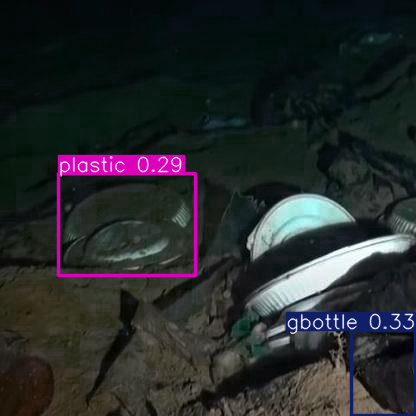


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-1126__fliph_jpeg_jpg.rf.2c7c8a44432fdb861f1398dc57d73f17.jpg: 640x640 1 pbottle, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


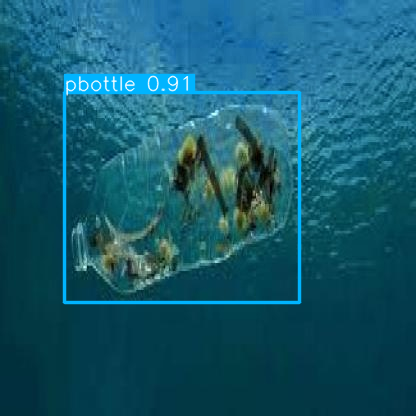


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-30__fliph_jpg.rf.bb4fce93025db0c55d0c9e4e2009eaa5.jpg: 640x640 1 misc, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


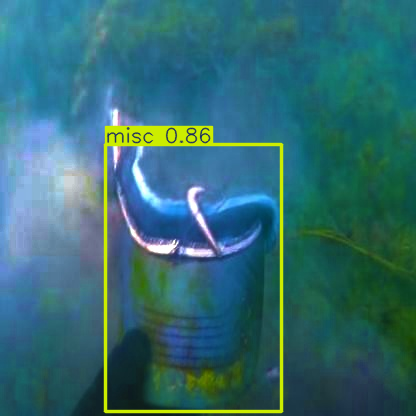


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-829__fliph_jpg.rf.c990068d5ec867682c8d444f7721731c.jpg: 640x640 1 pbag, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


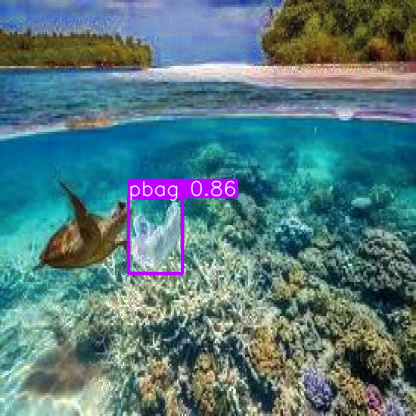


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-100__flipv_jpg.rf.570c14c1d5d5cda82591b9c9be98a24f.jpg: 640x640 1 pbottle, 9.3ms
Speed: 2.0ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


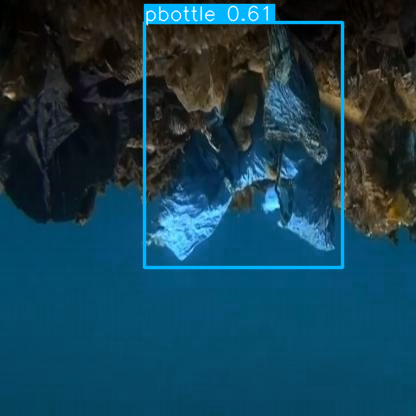


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-84__fliph_jpg.rf.69a77aed48b75073c41a020238016992.jpg: 640x640 2 pbottles, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


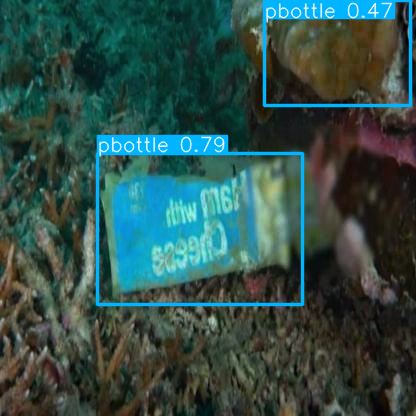


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-421_jpg.rf.e1606619bcbca17b5363ea51cc04b699.jpg: 640x640 1 cellphone, 10.6ms
Speed: 3.1ms preprocess, 10.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


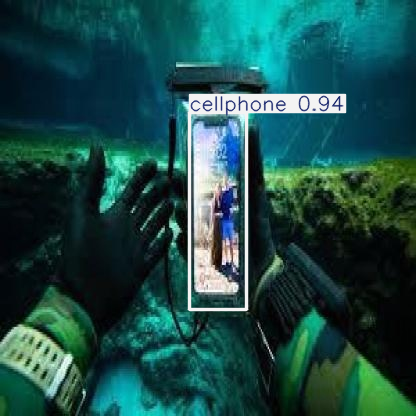


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_g-576_jpg.rf.7f8affd26d644953cb38ec397d97b2eb.jpg: 640x640 1 pbag, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


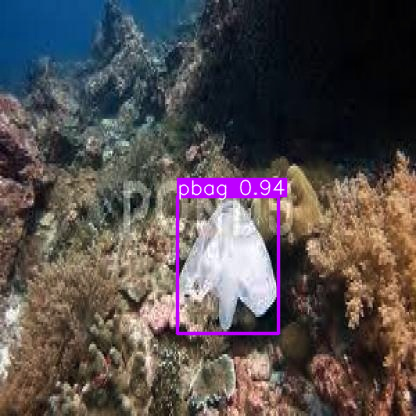


image 1/1 /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/uwg_yt-32_jpg.rf.c06ed964b4d7c98ba1e4bdd9ee371125.jpg: 640x640 1 can, 1 sunglasses, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


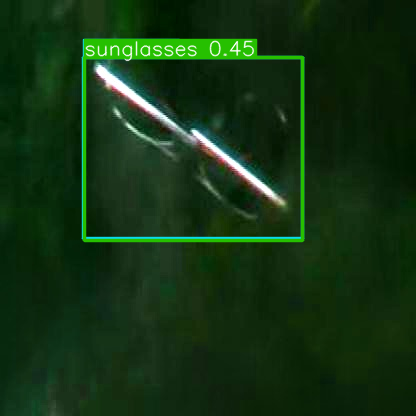

In [25]:
images = os.listdir("/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images")
for i in range(40):
    image = os.path.join("/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images", images[i])
    result_predict = Valid_model.predict(source = image, imgsz=(640), iou=0.4)

    # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))